<a href="https://colab.research.google.com/github/rostykpython/Project_Data/blob/main/effnet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense, BatchNormalization, GlobalAveragePooling2D, Flatten, Resizing, Input, Lambda, Dropout
from keras.models import Sequential
from keras.applications.efficientnet_v2 import EfficientNetV2B2, preprocess_input 
from keras.datasets import cifar10

In [ ]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

In [ ]:
conv_base = EfficientNetV2B2(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
conv_base.trainable = True

In [ ]:
conv_base.summary()

Model: "efficientnetv2-b2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['input_6[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 224, 224, 3)  0          ['rescaling_1[0][0]']            
 )                                                                                                
                                                                                  

In [ ]:
for layer in conv_base.layers:
  if not layer.name.startswith(('top', 'block6')):
    layer.trainable = False

In [ ]:
conv_base.summary()

Model: "efficientnetv2-b2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['input_6[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 224, 224, 3)  0          ['rescaling_1[0][0]']            
 )                                                                                                
                                                                                  

In [ ]:
import imgaug.augmenters as iaa
import numpy as np


aug = iaa.SomeOf((1, 3),[
    iaa.Affine(rotate=40),
    iaa.AdditiveGaussianNoise(scale=0.1*255),
    iaa.Add(20, per_channel=True),
    iaa.Sharpen(alpha=0.2),
    iaa.Affine(translate_px={"x":-10})
])


x_train_aug = aug(images=x_train)

In [ ]:
x_train = np.concatenate([x_train, x_train_aug])
y_train = np.concatenate([y_train, y_train])

In [ ]:
inputs = Input(shape=(32, 32, 3))
x = Resizing(224, 224)(inputs)
x = Lambda(lambda x: preprocess_input(x))(x)
x = conv_base(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001), kernel_initializer='he_uniform')(x)
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
x = Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001), kernel_initializer='he_uniform')(x)
x = BatchNormalization()(x)
output = Dense(10, activation='softmax')(x)
model = tf.keras.Model(inputs, output)

In [ ]:
model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 resizing_5 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 lambda_5 (Lambda)           (None, 224, 224, 3)       0         
                                                                 
 efficientnetv2-b2 (Function  (None, 7, 7, 1408)       8769374   
 al)                                                             
                                                                 
 global_average_pooling2d_5   (None, 1408)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_10 (Dropout)        (None, 1408)              0   

In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['acc']
)

In [ ]:
history = model.fit(
    x_train,
    y_train,
    epochs=5,
    batch_size=256,
    validation_data=(x_test, y_test)

)

Epoch 1/5
391/391 [==============================] - 331s 824ms/step - loss: 1.7492 - acc: 0.8455 - val_loss: 0.7105 - val_acc: 0.9524
Epoch 2/5
391/391 [==============================] - 320s 820ms/step - loss: 0.5188 - acc: 0.9245 - val_loss: 0.2815 - val_acc: 0.9550
Epoch 3/5
391/391 [==============================] - 321s 820ms/step - loss: 0.2542 - acc: 0.9471 - val_loss: 0.2083 - val_acc: 0.9582
Epoch 4/5
391/391 [==============================] - 323s 827ms/step - loss: 0.1907 - acc: 0.9591 - val_loss: 0.2128 - val_acc: 0.9567
Epoch 5/5
391/391 [==============================] - 320s 819ms/step - loss: 0.1582 - acc: 0.9674 - val_loss: 0.2074 - val_acc: 0.9569


(0.6, 1.0)

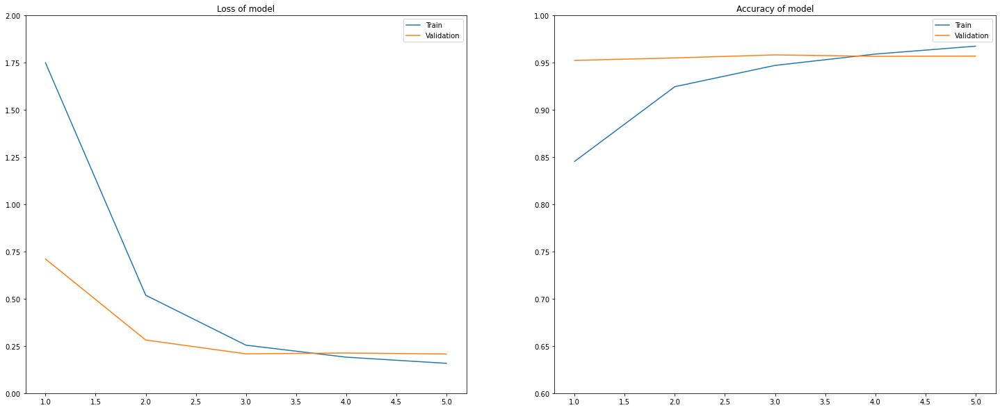

In [ ]:
import matplotlib.pyplot as plt

history_dict = history.history

epochs = [i for i in range(1, 6)]
fig, ax = plt.subplots(1, 2)

fig.set_figheight(10)
fig.set_figwidth(25)

ax[0].set_title("Loss of model")
ax[0].plot(epochs, history_dict['loss'], label='Train')
ax[0].plot(epochs, history_dict['val_loss'], label='Validation')
ax[0].legend()
ax[0].set_ylim([0, 2.])

ax[1].set_title("Accuracy of model")
ax[1].plot(epochs, history_dict['acc'], label='Train')
ax[1].plot(epochs, history_dict['val_acc'], label='Validation')
ax[1].legend()
ax[1].set_ylim([0.6, 1.0])

In [ ]:
from pathlib import Path
from PIL import Image



images = (img for img in Path('/content/images').iterdir())

def find_img_prediction(path, model=model):
  f = Image.open(path)
  fig, ax = plt.subplots(1, 2)
  fig.set_figheight(10)
  fig.set_figwidth(15)
  ax[0].imshow(f)
  img_array = tf.keras.preprocessing.image.img_to_array(f)
  resized_img_array = tf.image.resize(img_array, (32, 32))
  valid_array = np.stack((resized_img_array,), axis=0)

  prediction = model.predict(valid_array)
  ax[1].bar(height=prediction.flatten(), x=[str(i) for i in range(10)])

  class_names = ['airplane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog',
                   'horse', 'ship', 'truck']
  return class_names[np.argmax(prediction)]


'horse'

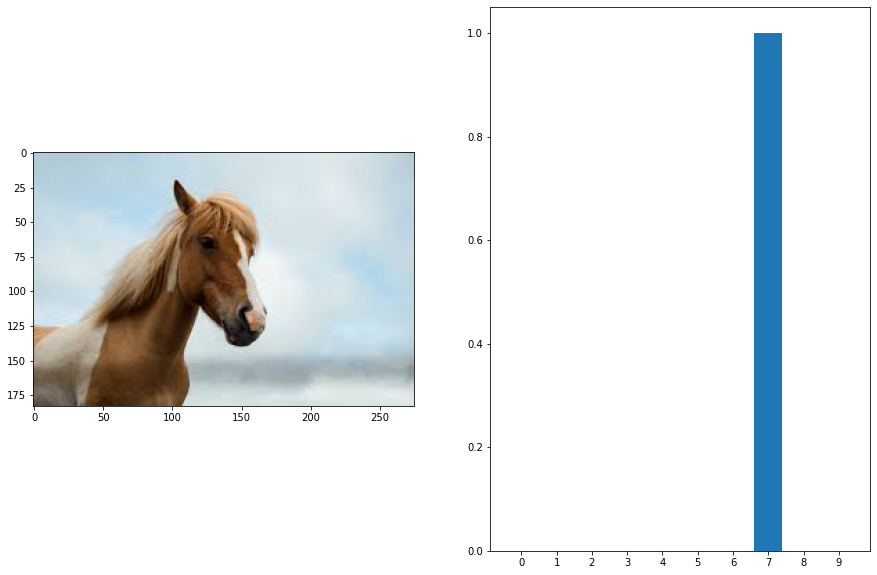

In [ ]:
find_img_prediction(next(images))

'deer'

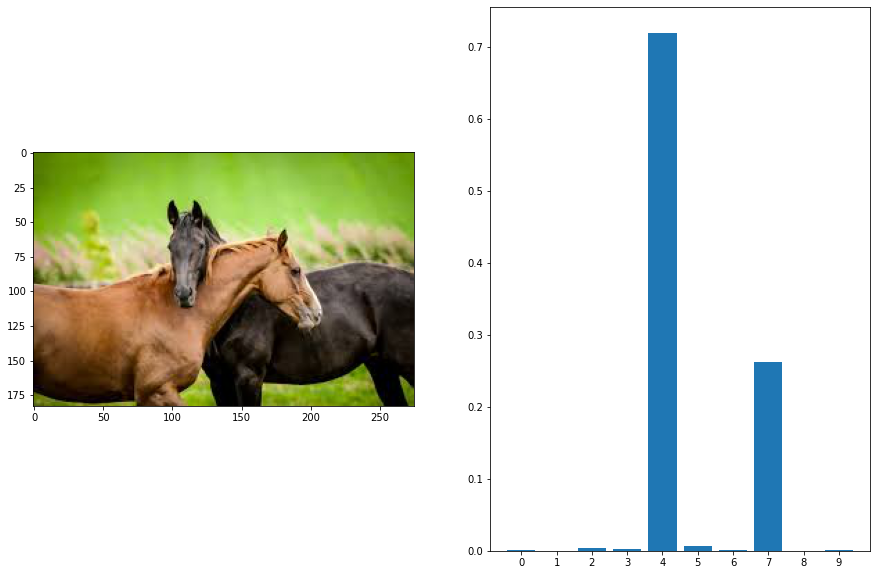

In [ ]:
find_img_prediction(next(images))

'car'

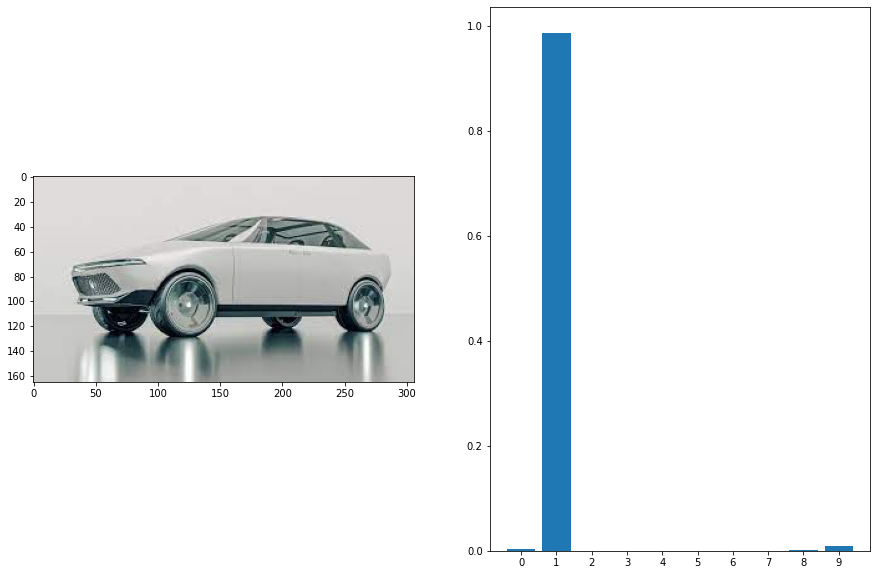

In [ ]:
find_img_prediction(next(images))

'car'

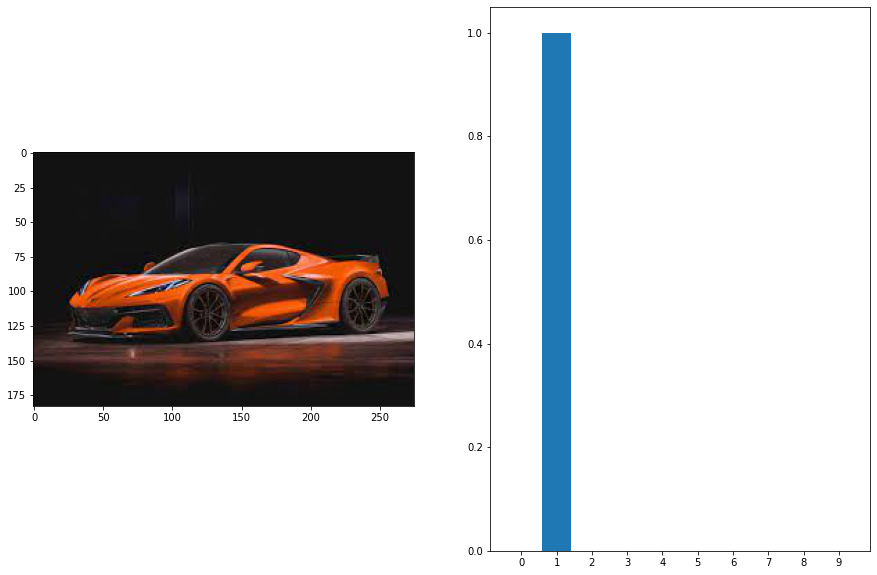

In [ ]:
find_img_prediction(next(images))

'car'

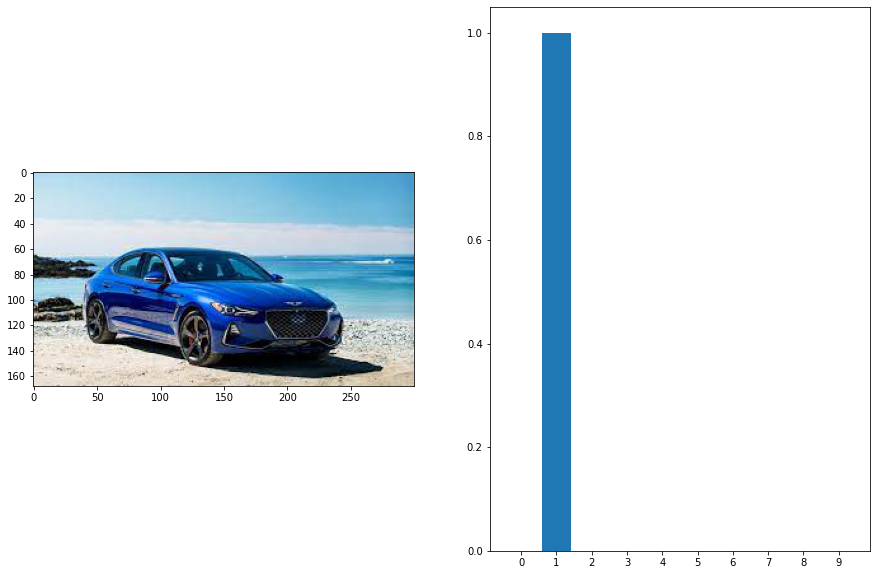

In [ ]:
find_img_prediction(next(images))

'car'

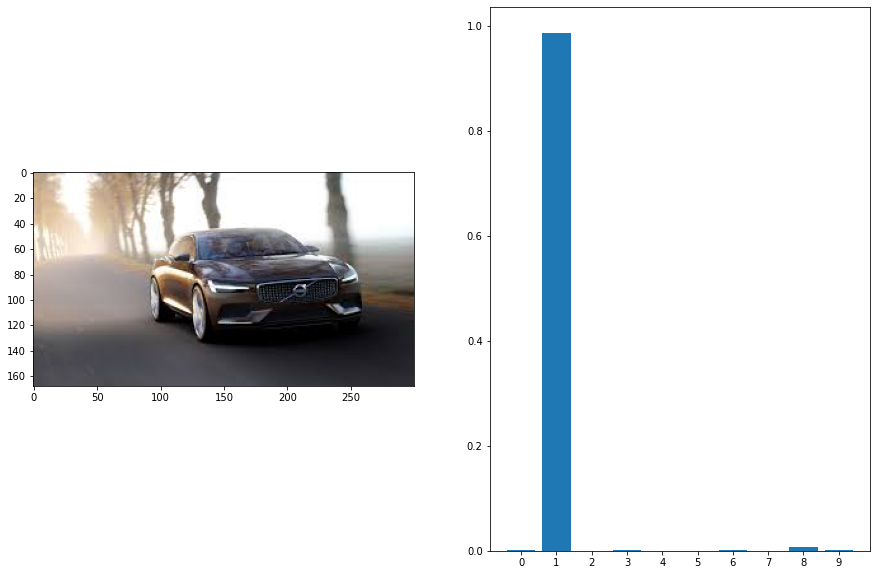

In [ ]:
find_img_prediction(next(images))

'frog'

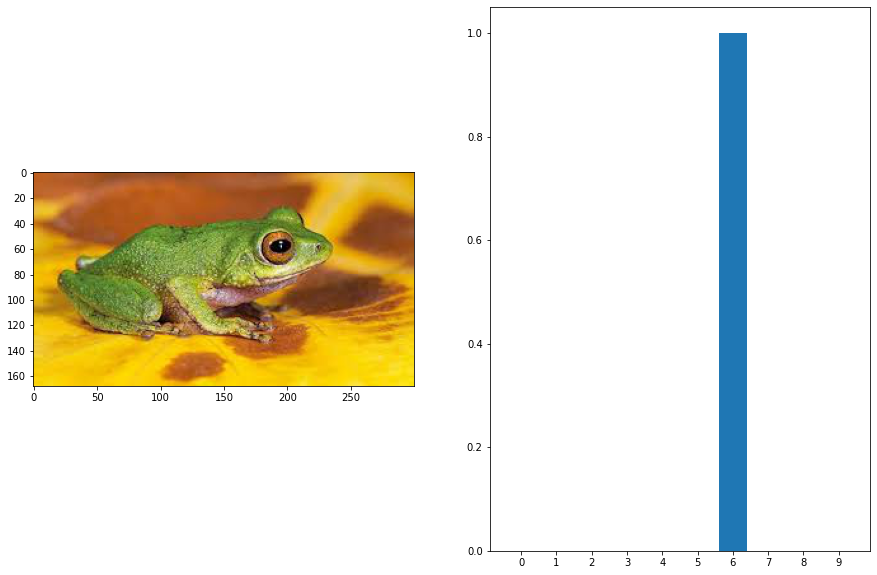

In [ ]:
find_img_prediction(next(images))

'cat'

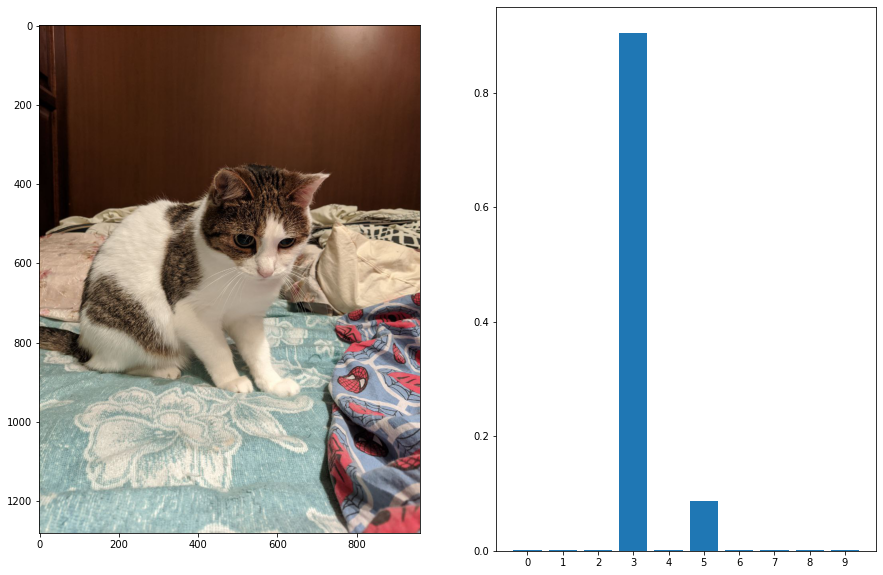

In [ ]:
find_img_prediction(next(images))

'ship'

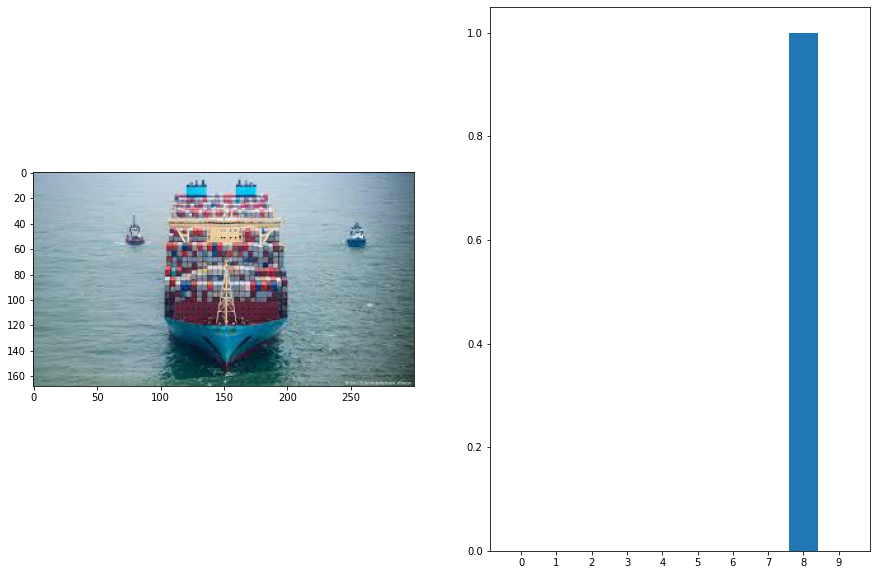

In [ ]:
find_img_prediction(next(images))

'bird'

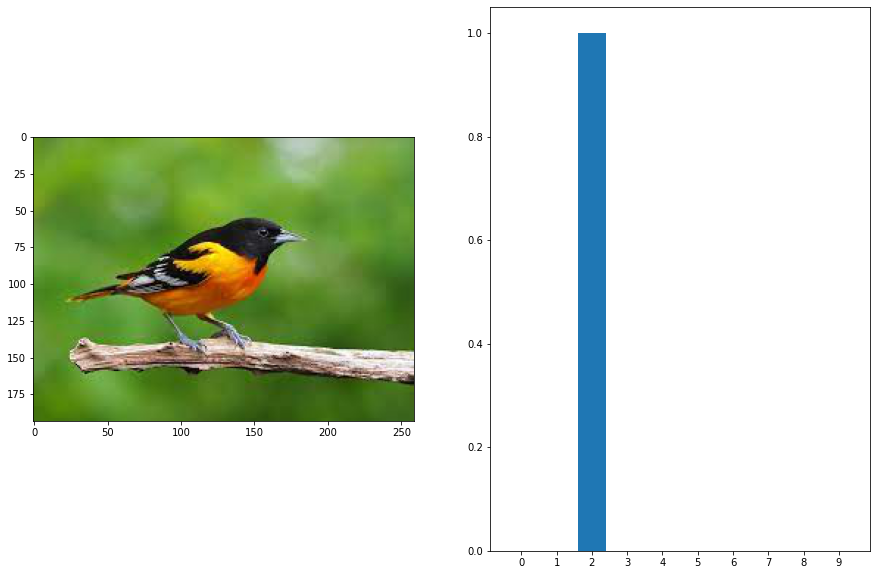

In [ ]:
find_img_prediction(next(images))

'car'

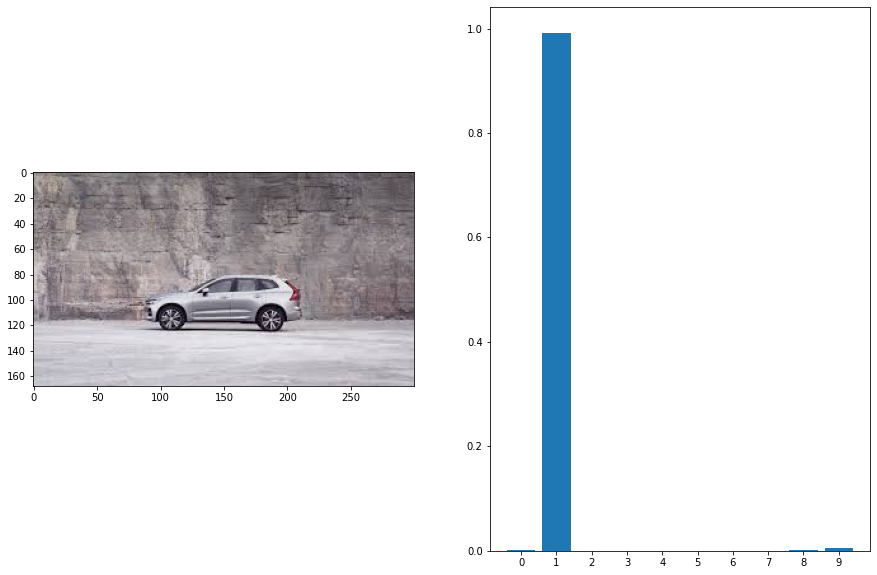

In [ ]:
find_img_prediction(next(images))

'cat'

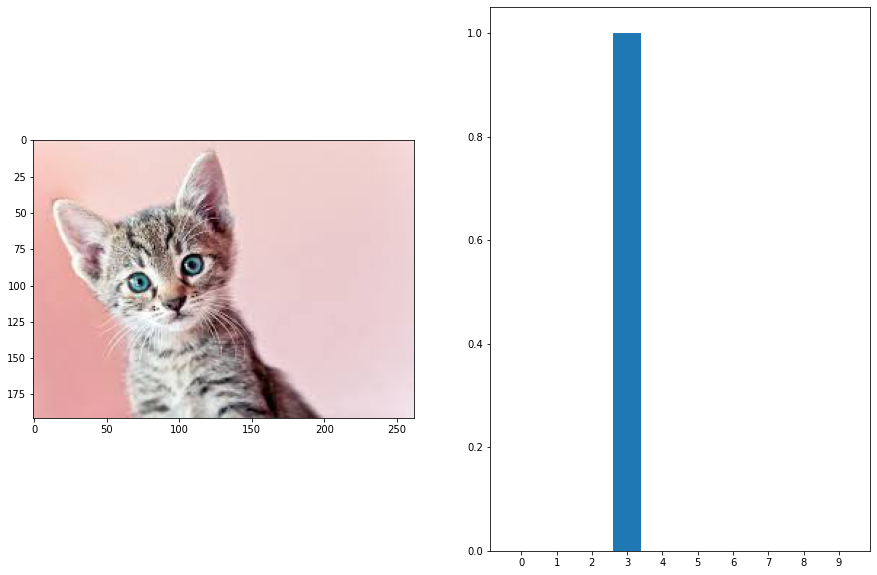

In [ ]:
find_img_prediction(next(images))

'bird'

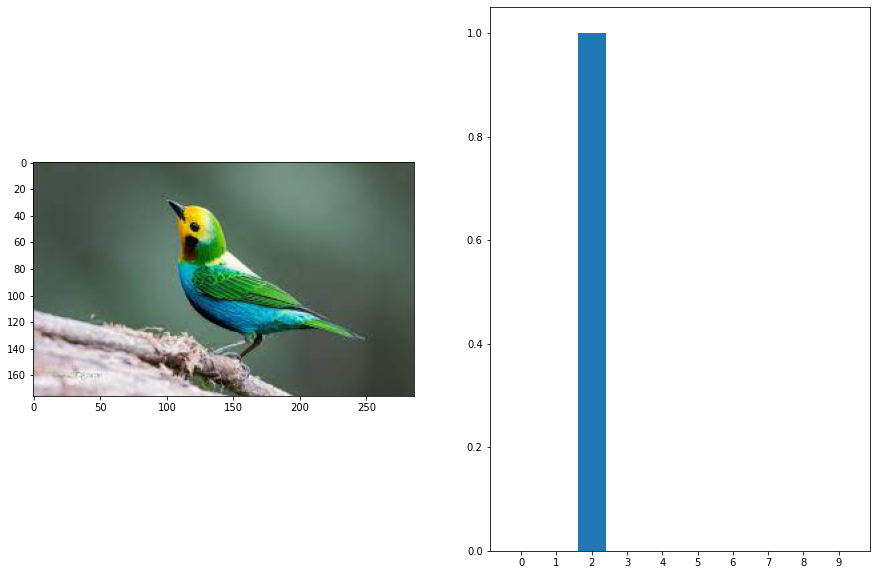

In [ ]:
find_img_prediction(next(images))

'deer'

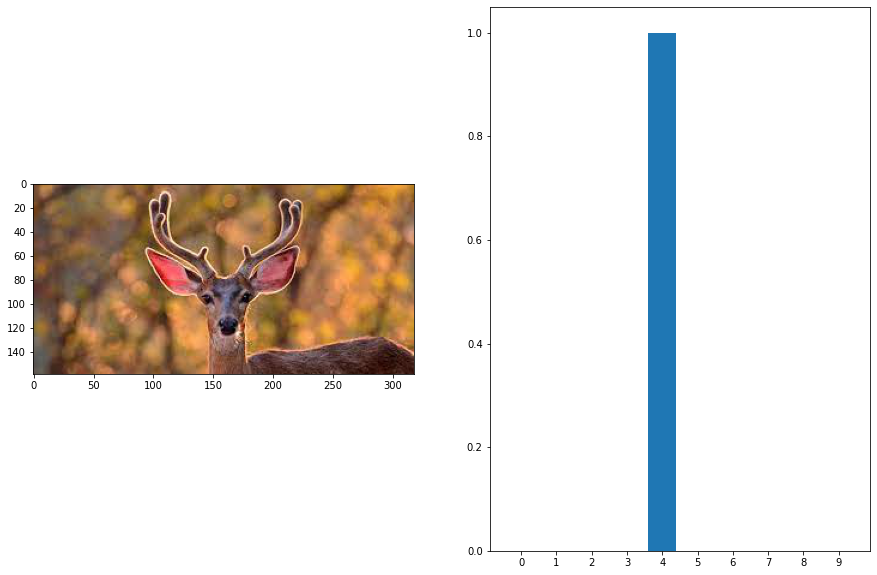

In [ ]:
find_img_prediction(next(images))

'horse'

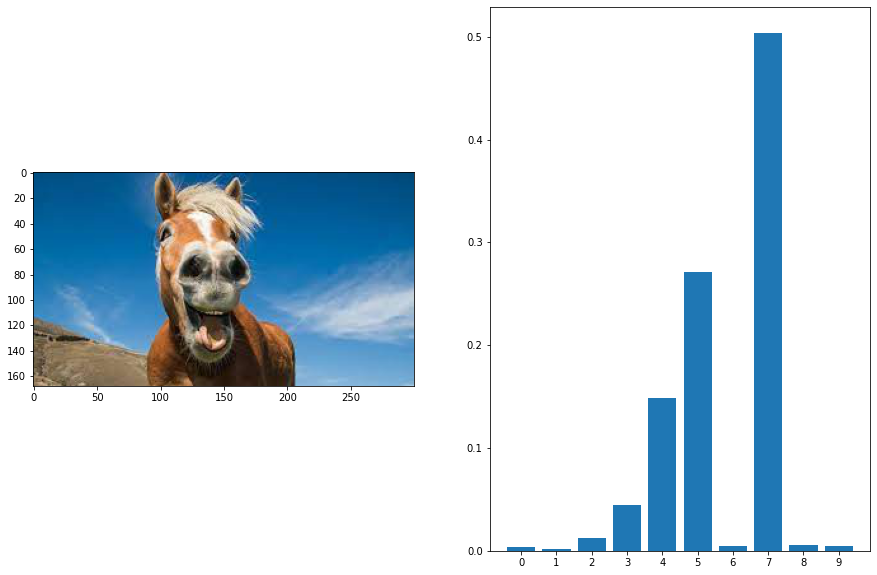

In [ ]:
find_img_prediction(next(images))

'ship'

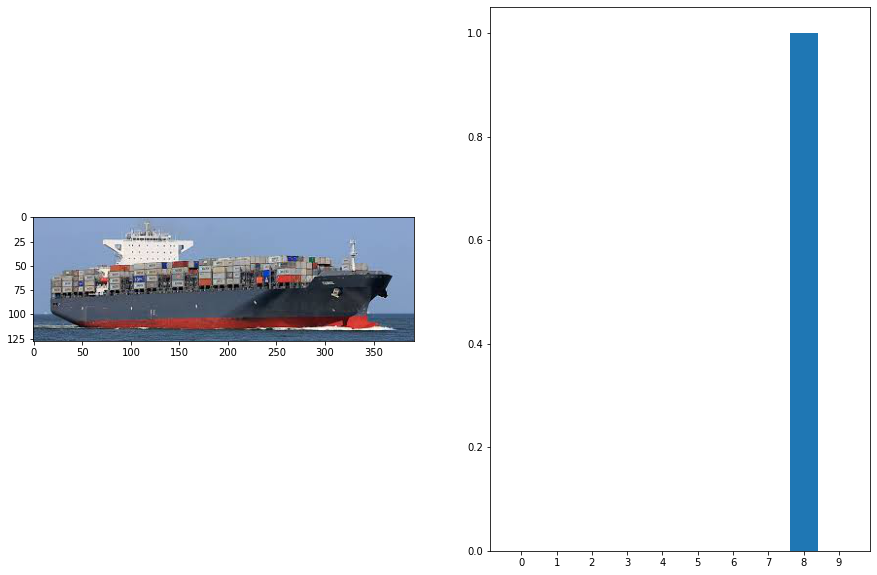

In [ ]:
find_img_prediction(next(images))

'deer'

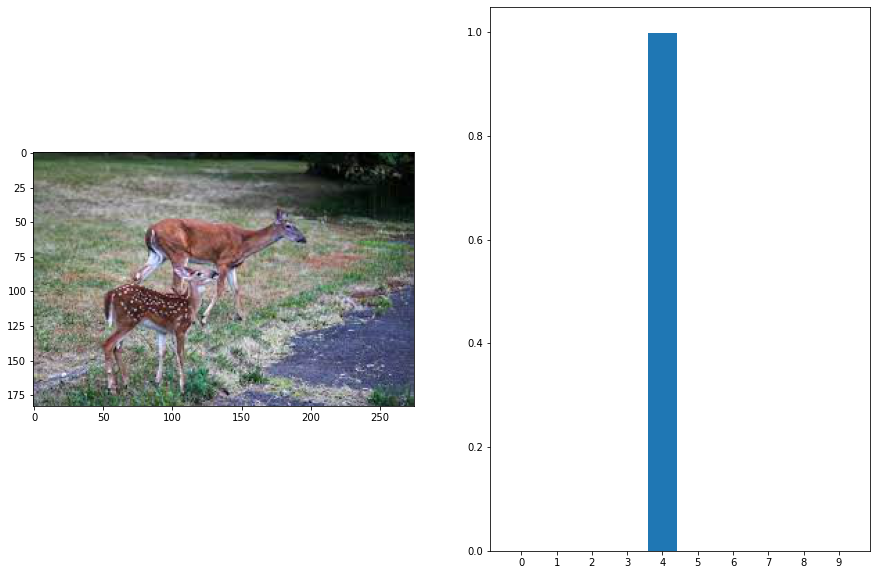

In [ ]:
find_img_prediction(next(images))

'truck'

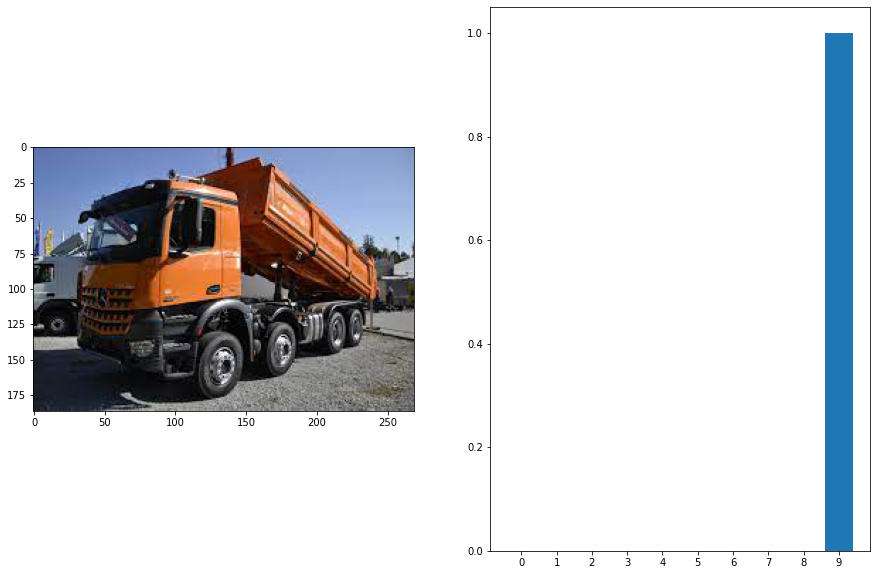

In [ ]:
find_img_prediction(next(images))

'deer'

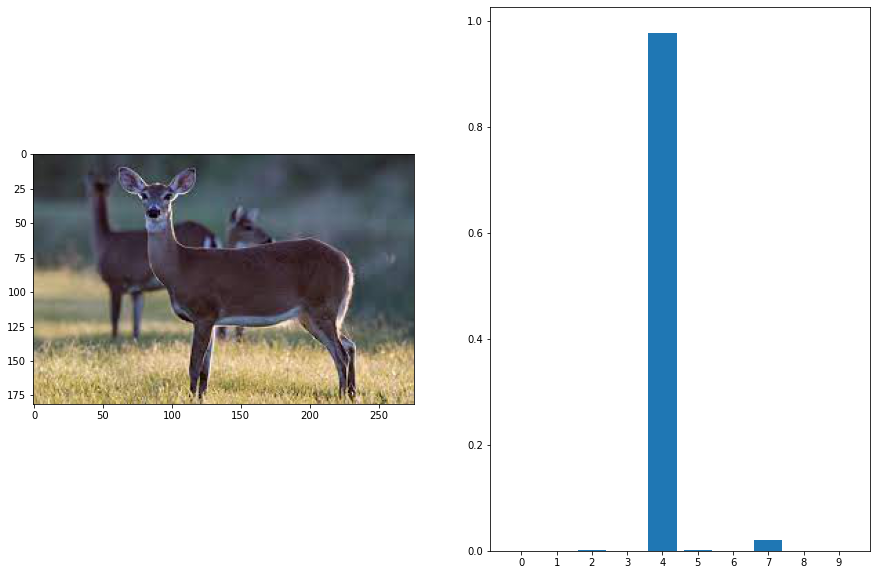

In [ ]:
find_img_prediction(next(images))

'horse'

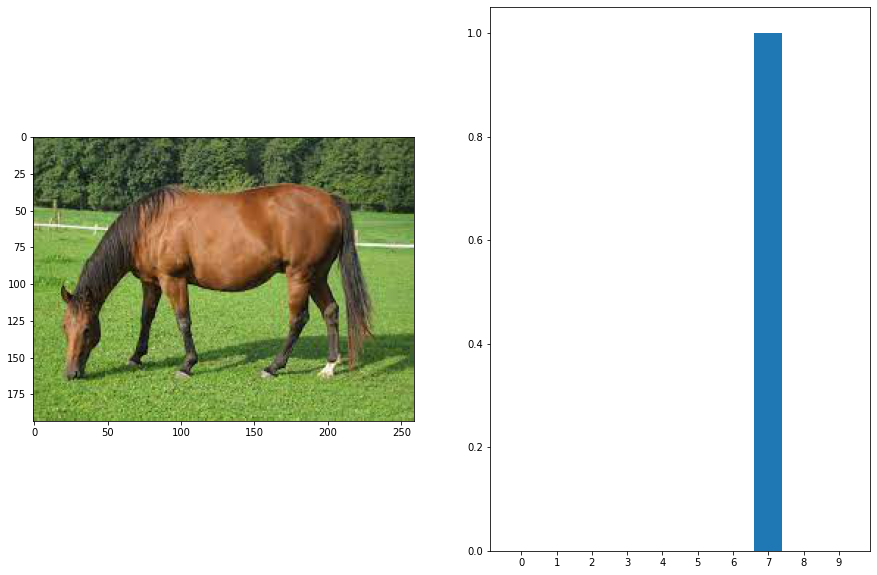

In [ ]:
find_img_prediction(next(images))

'horse'

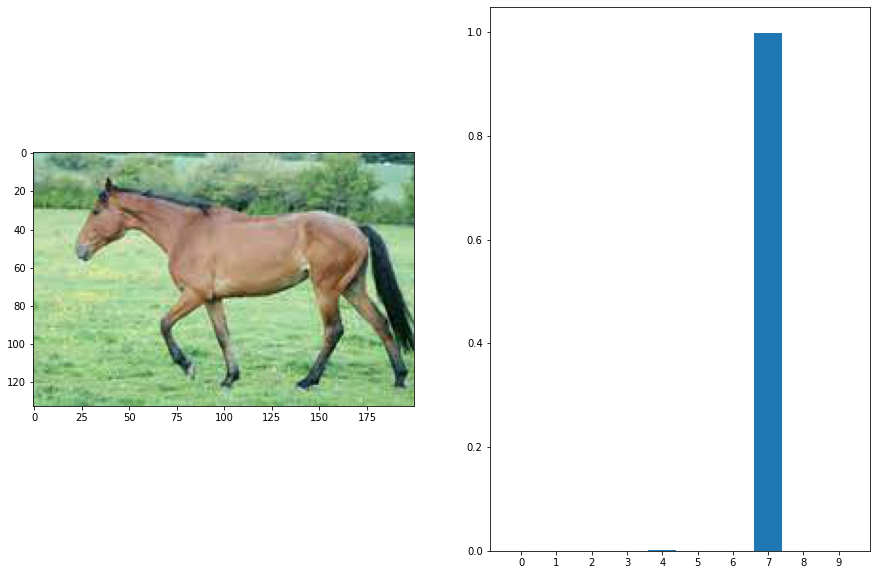

In [ ]:
find_img_prediction(next(images))

'car'

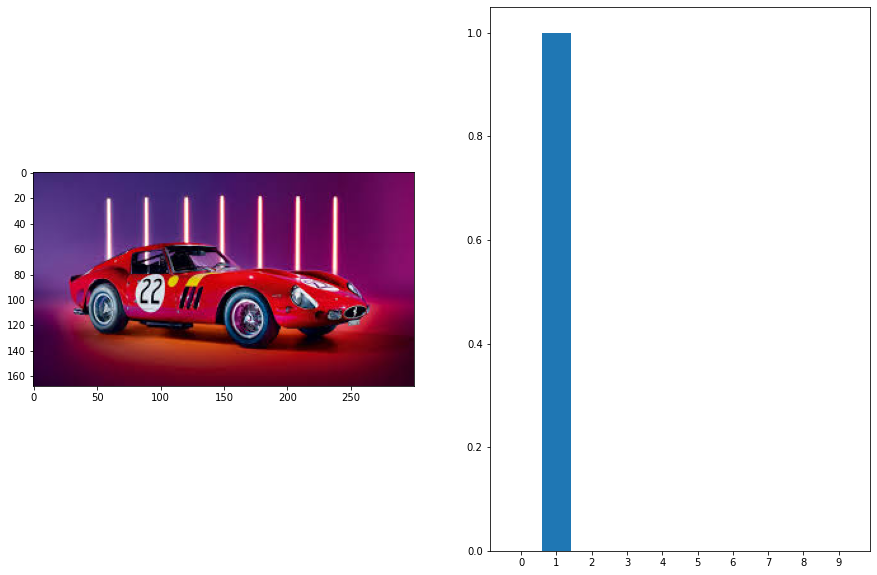

In [ ]:
find_img_prediction(next(images))

'frog'

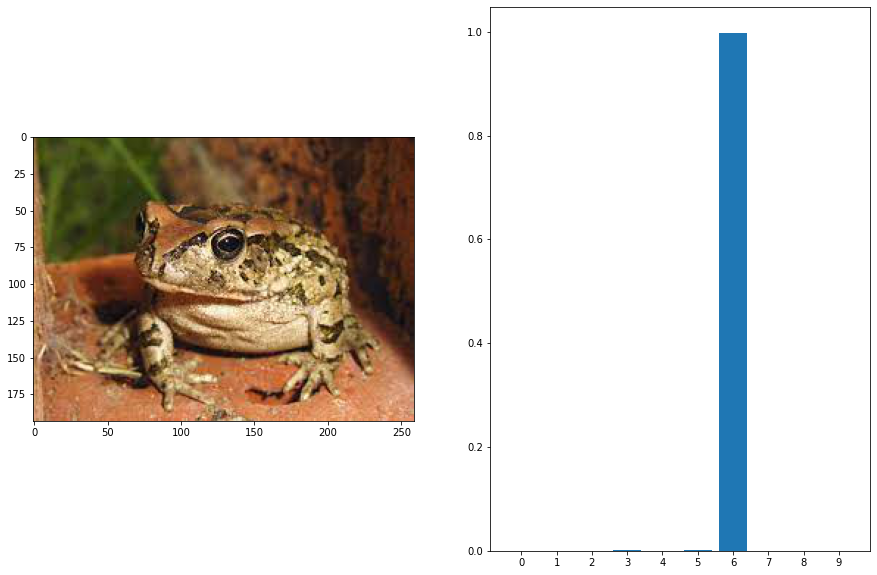

In [ ]:
find_img_prediction(next(images))

'ship'

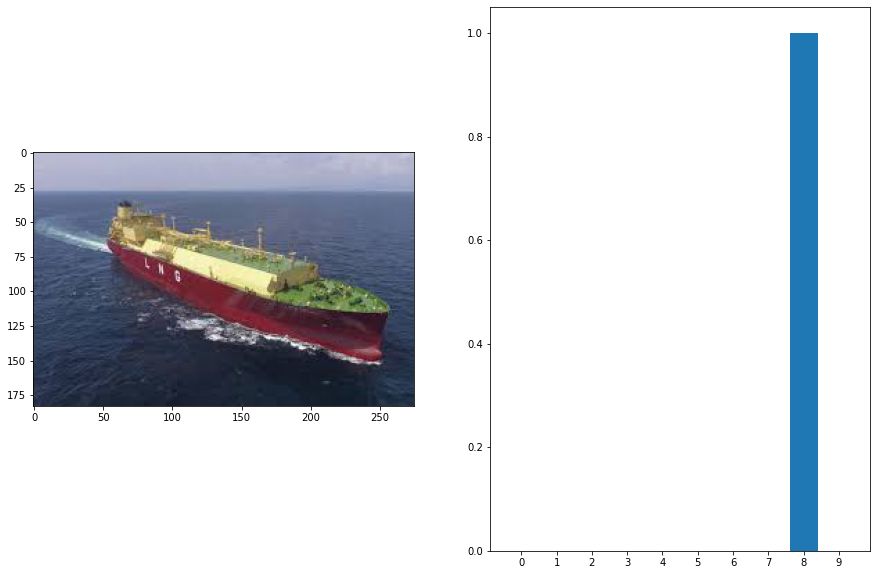

In [ ]:
find_img_prediction(next(images))

'bird'

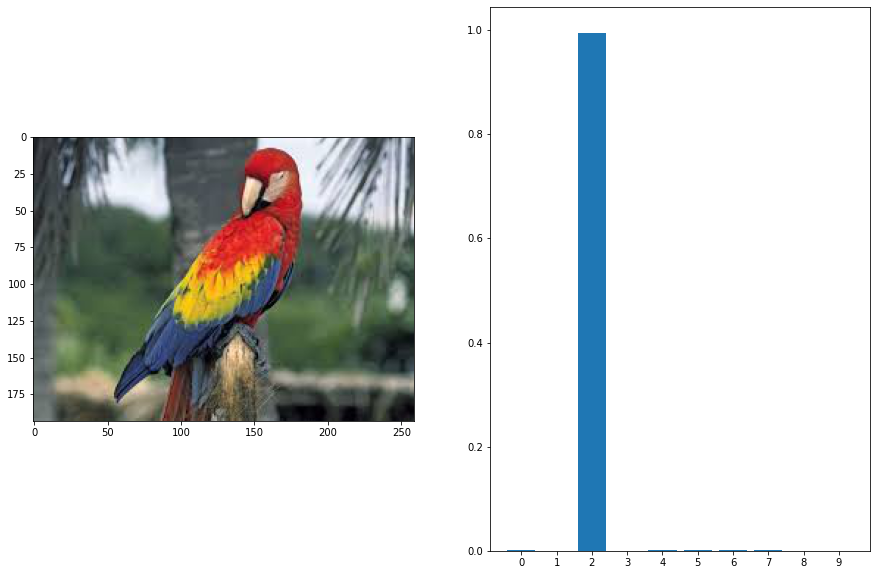

In [ ]:
find_img_prediction(next(images))

'frog'

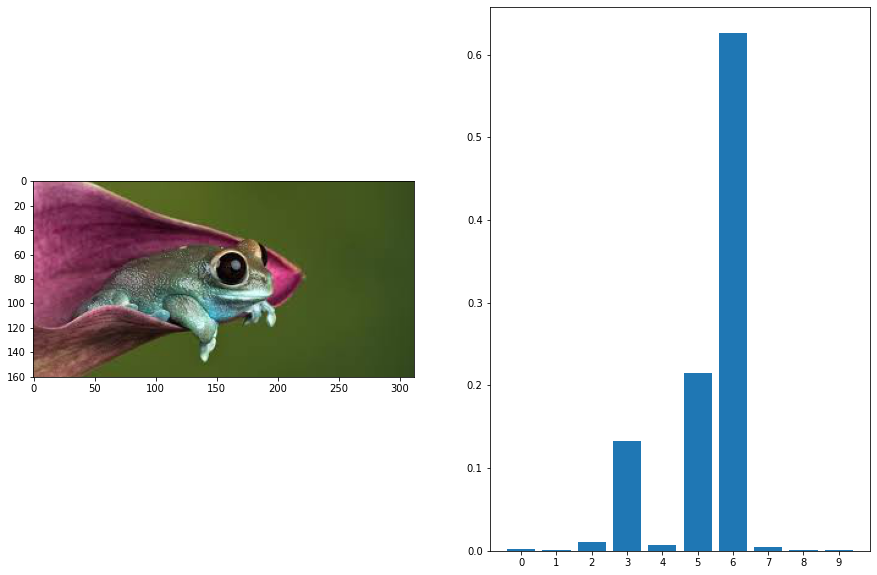

In [ ]:
find_img_prediction(next(images))

'cat'

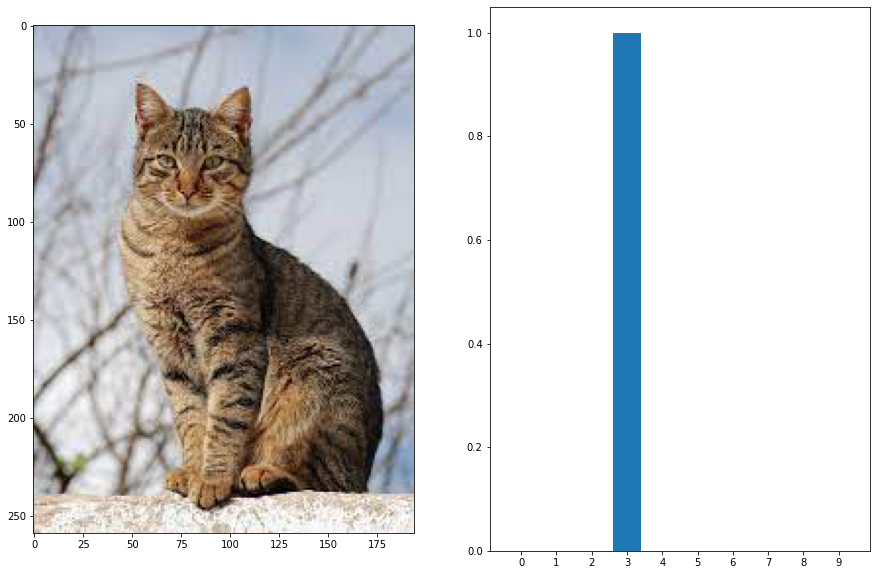

In [ ]:
find_img_prediction(next(images))

'horse'

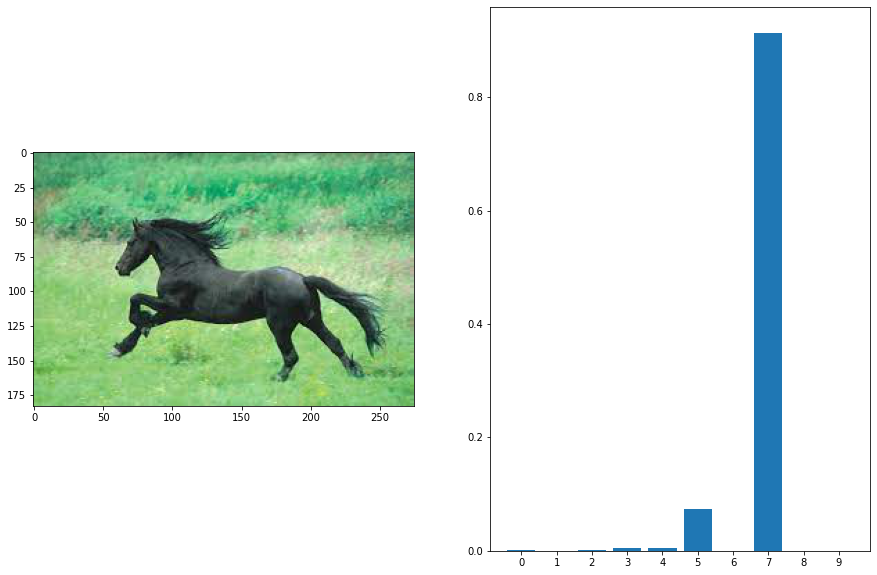

In [ ]:
find_img_prediction(next(images))

'bird'

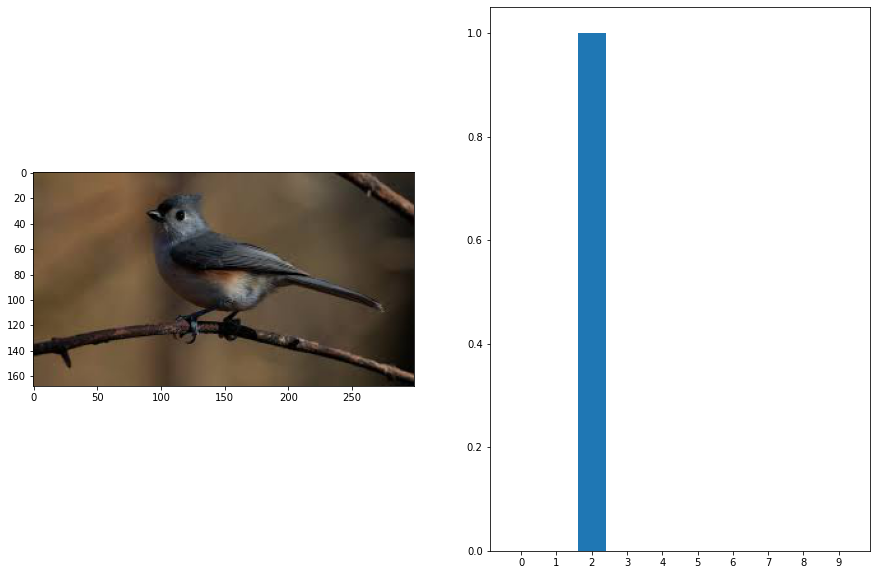

In [ ]:
find_img_prediction(next(images))

'frog'

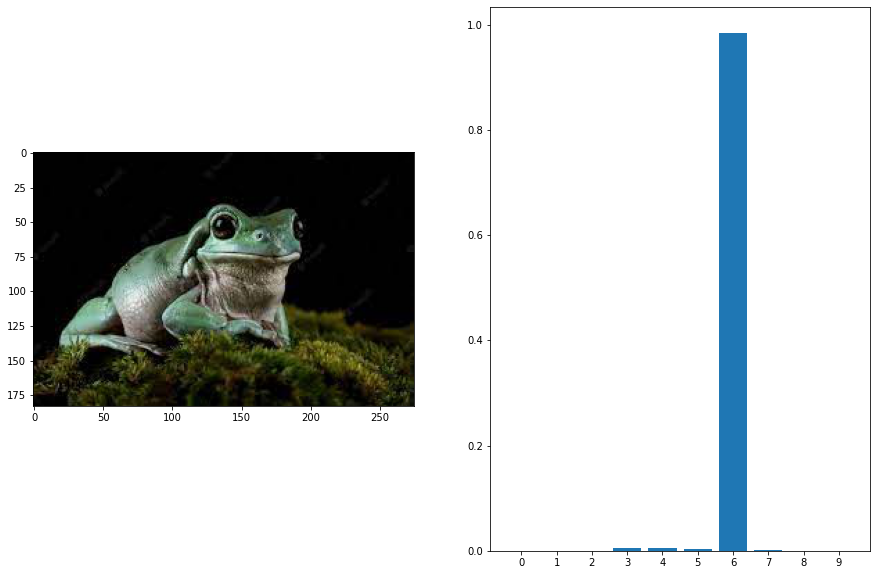

In [ ]:
find_img_prediction(next(images))

'dog'

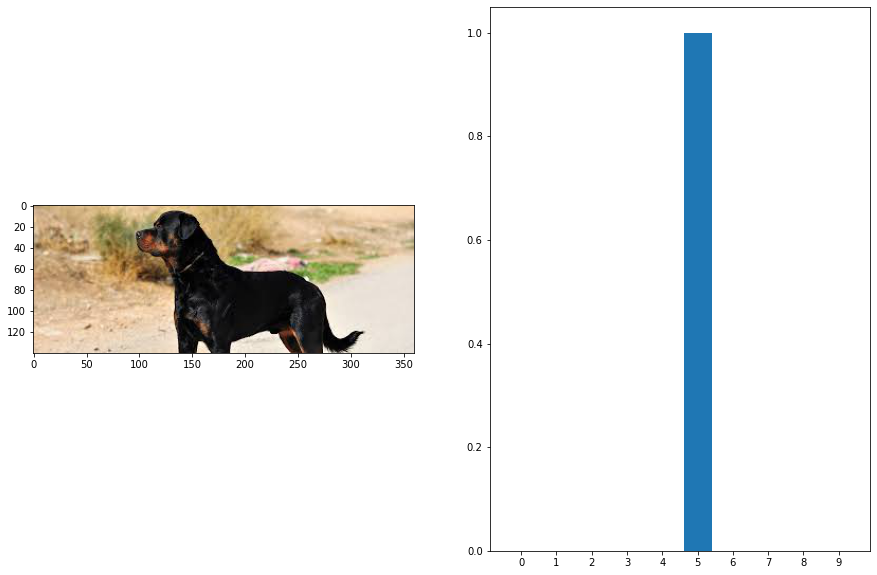

In [ ]:
find_img_prediction(next(images))

'frog'

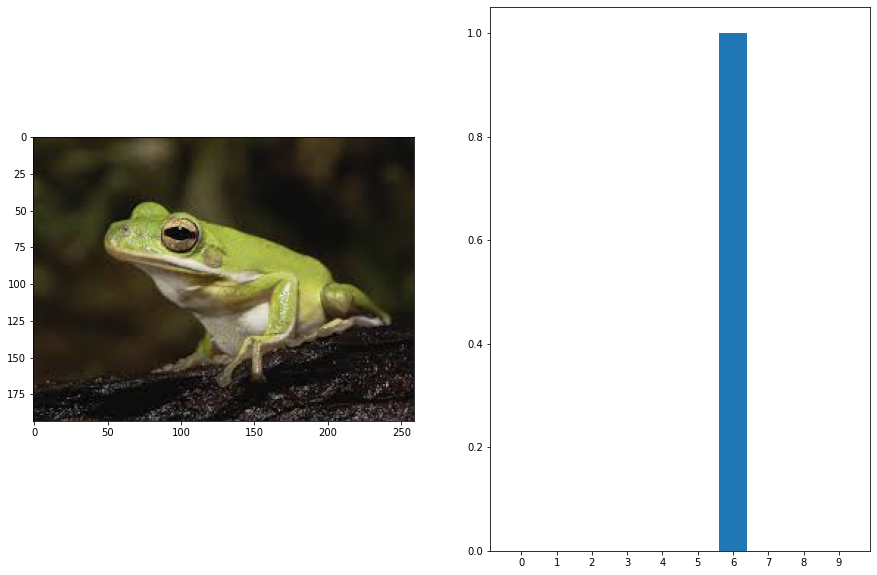

In [ ]:
find_img_prediction(next(images))

'cat'

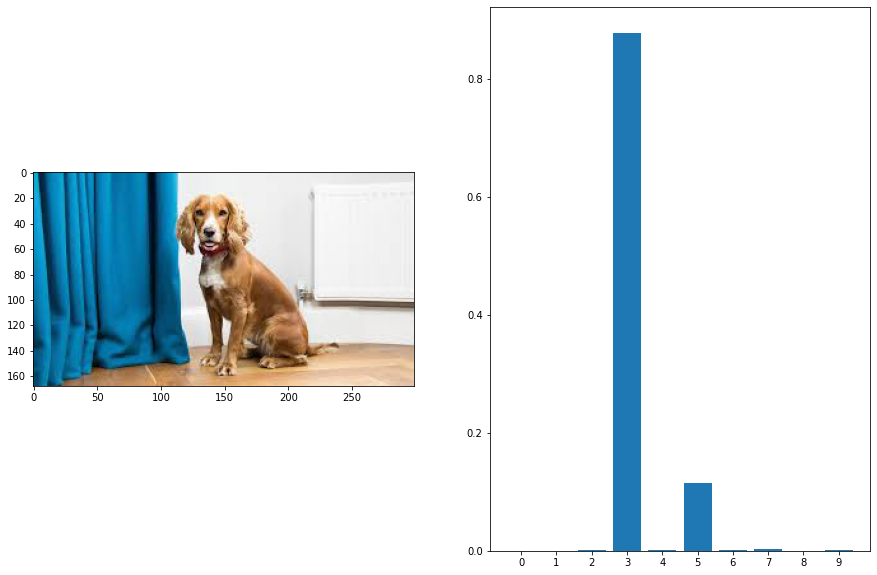

In [ ]:
find_img_prediction(next(images))

'car'

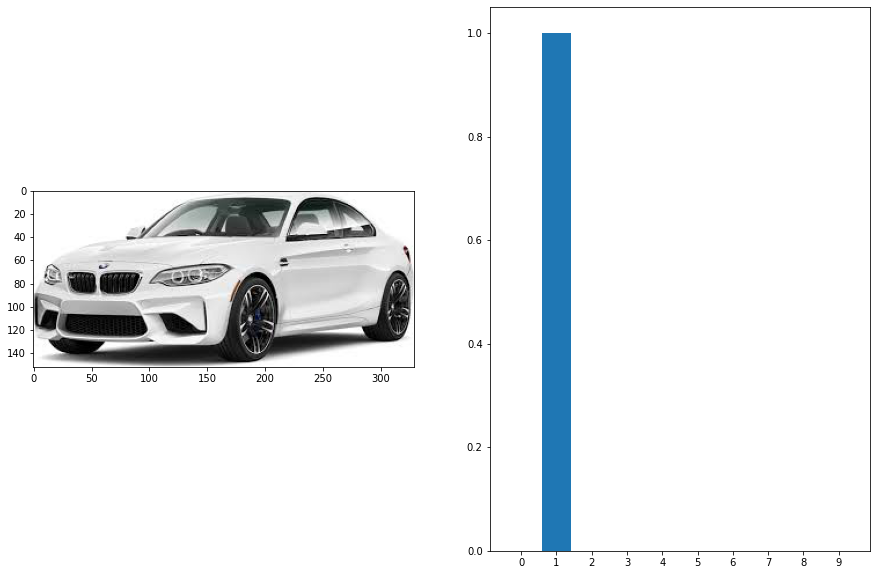

In [ ]:
find_img_prediction(next(images))

'cat'

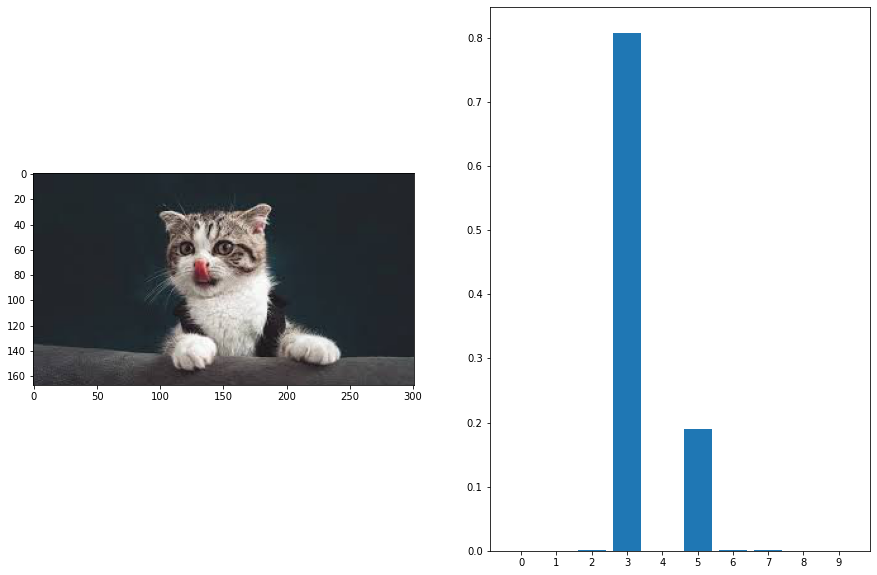

In [ ]:
find_img_prediction(next(images))

'cat'

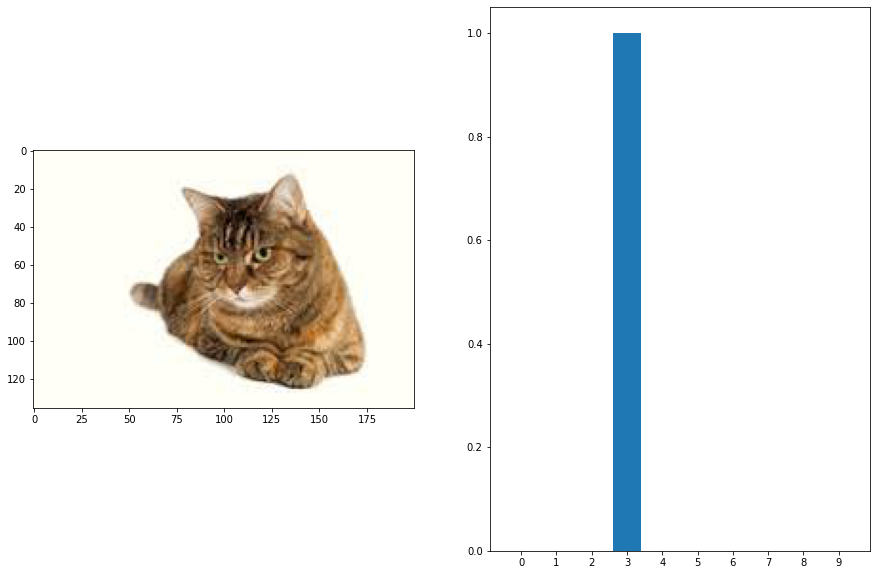

In [ ]:
find_img_prediction(next(images))

'bird'

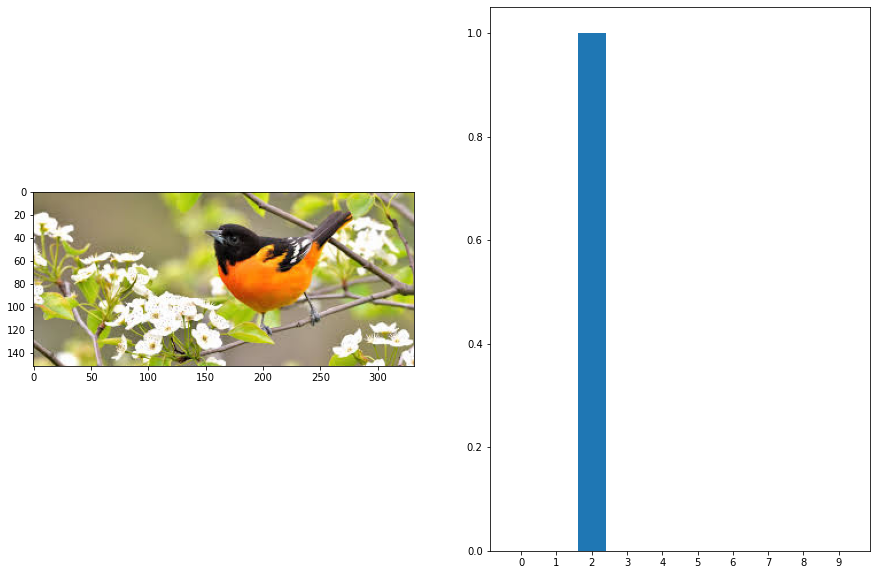

In [ ]:
find_img_prediction(next(images))

'cat'

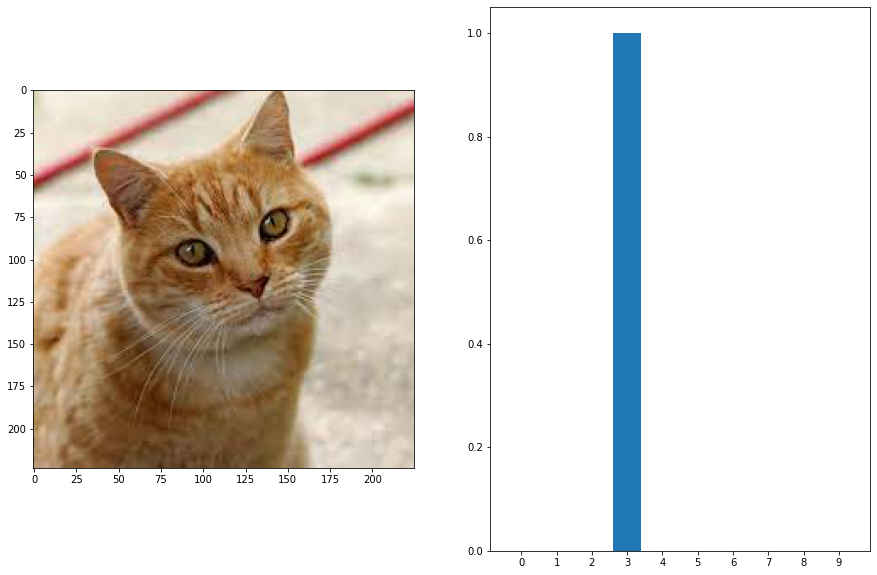

In [ ]:
find_img_prediction(next(images))

'airplane'

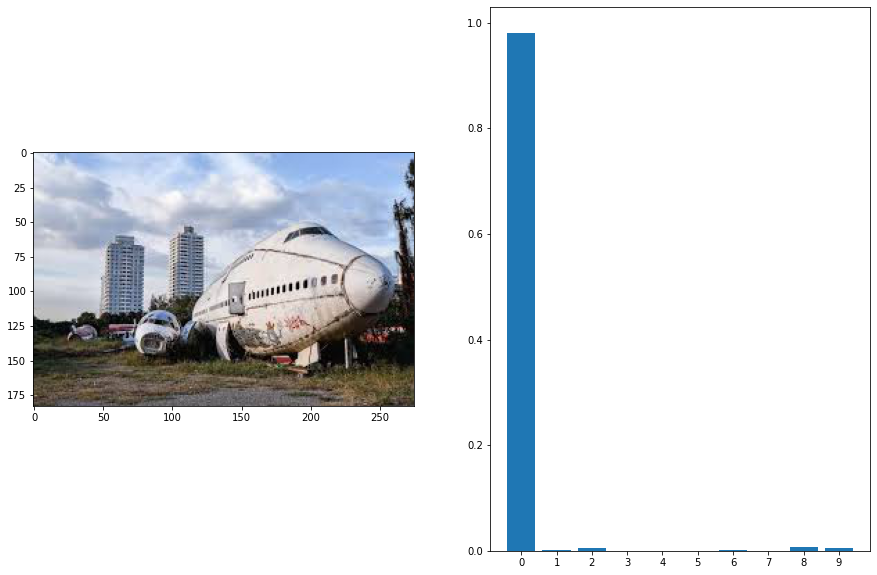

In [ ]:
find_img_prediction(next(images))

'car'

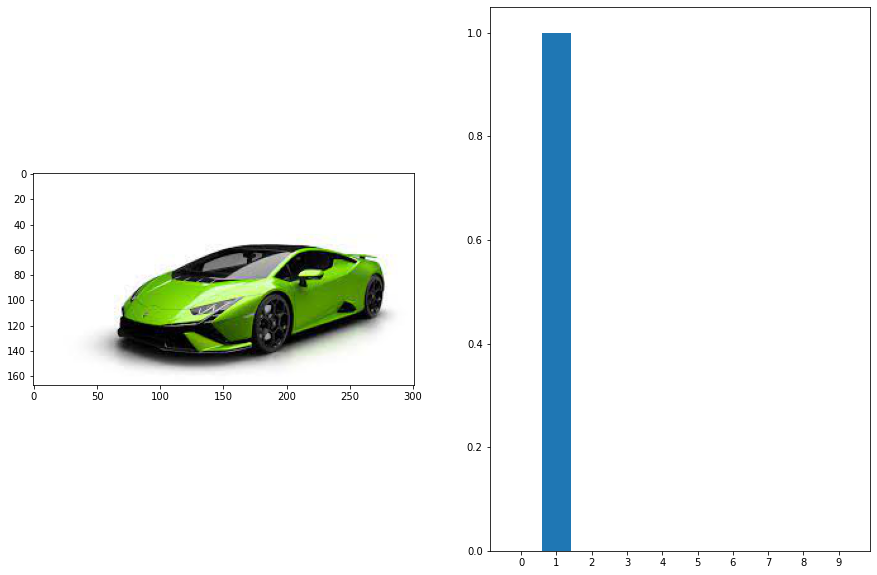

In [ ]:
find_img_prediction(next(images))

'deer'

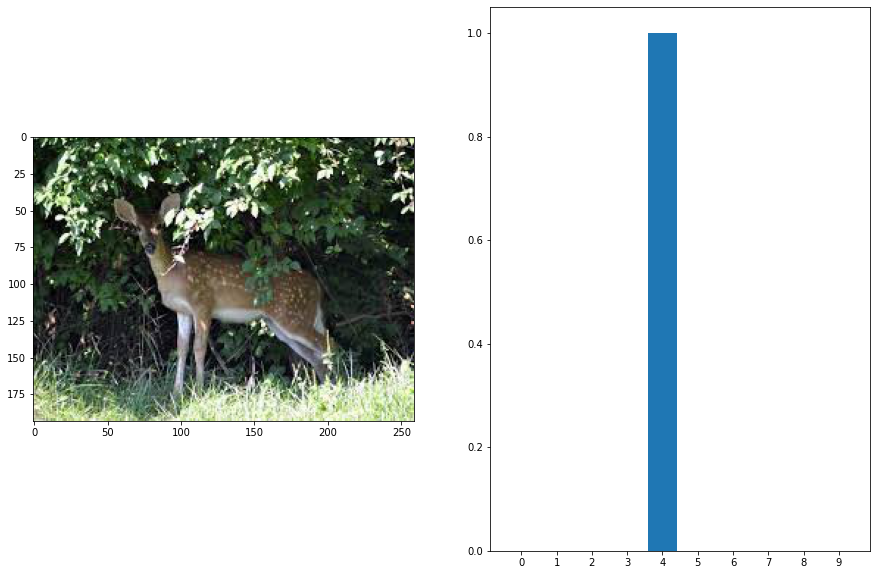

In [ ]:
find_img_prediction(next(images))

'car'

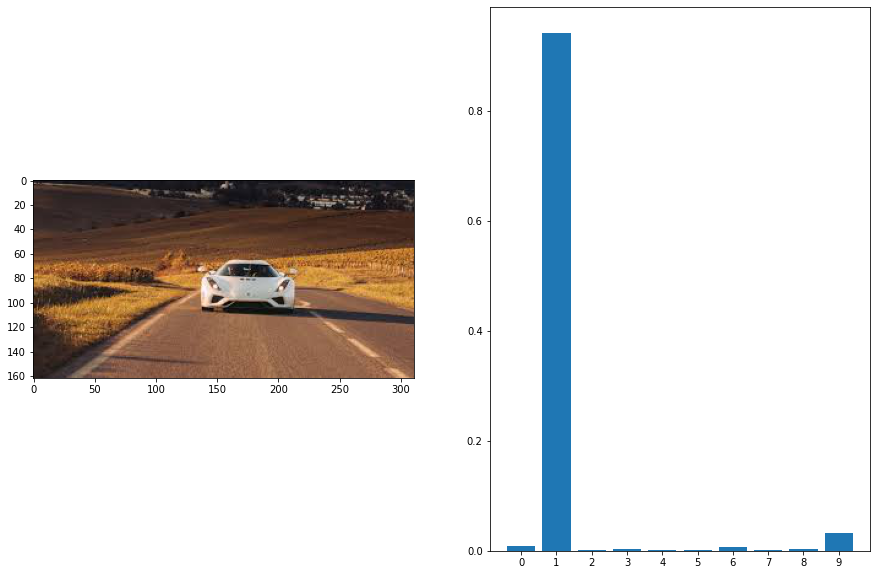

In [ ]:
find_img_prediction(next(images))

'ship'

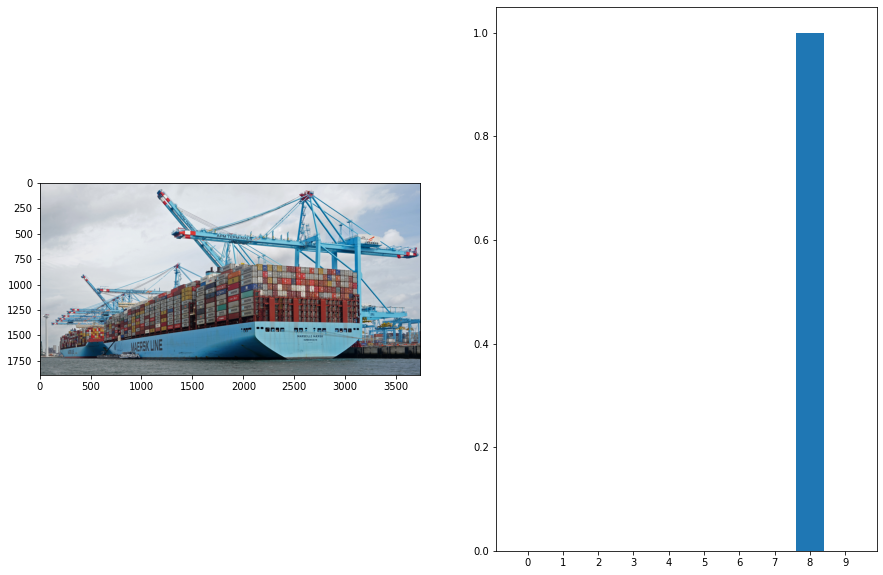

In [ ]:
find_img_prediction(next(images))

'ship'

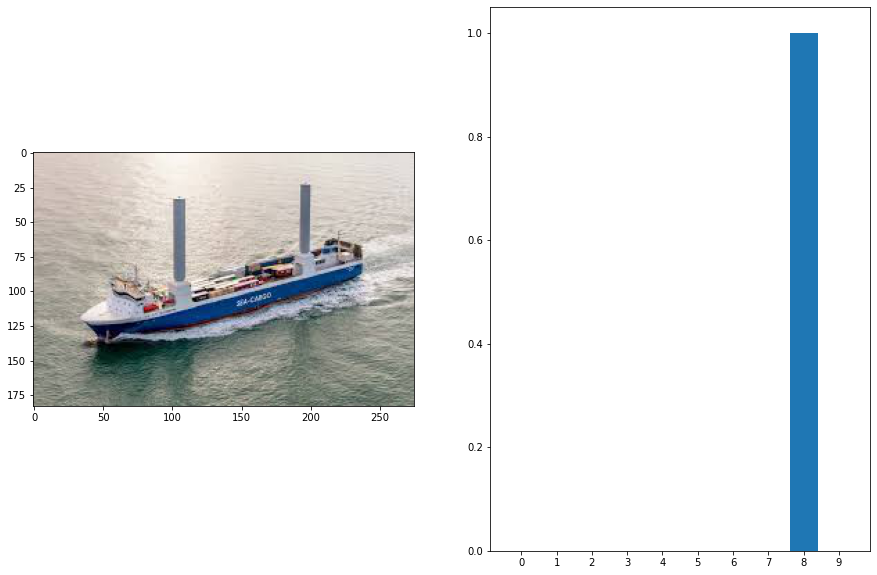

In [ ]:
find_img_prediction(next(images))

'cat'

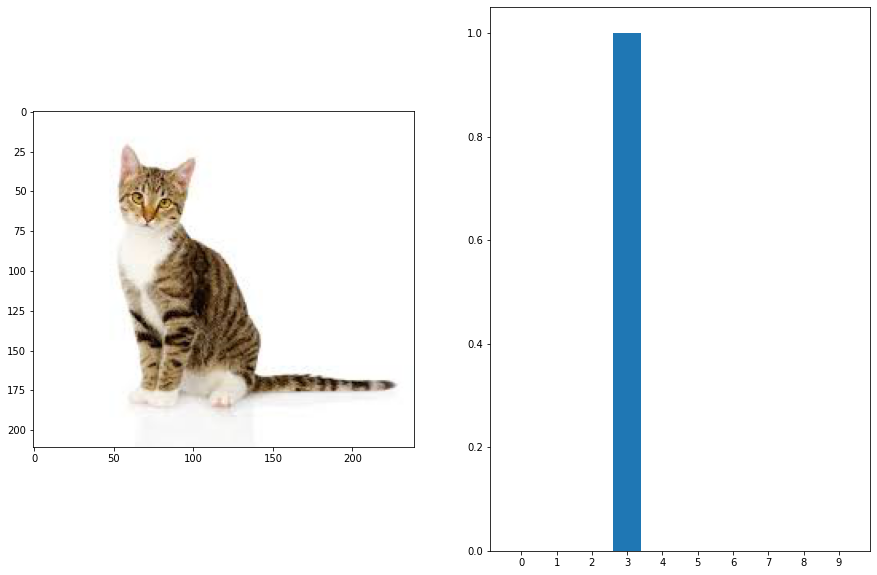

In [ ]:
find_img_prediction(next(images))

'deer'

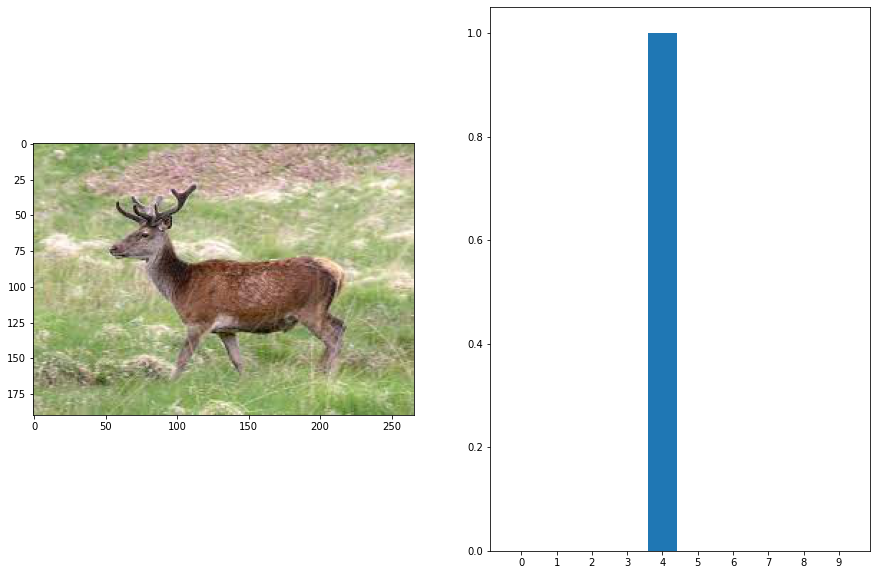

In [ ]:
find_img_prediction(next(images))

'ship'

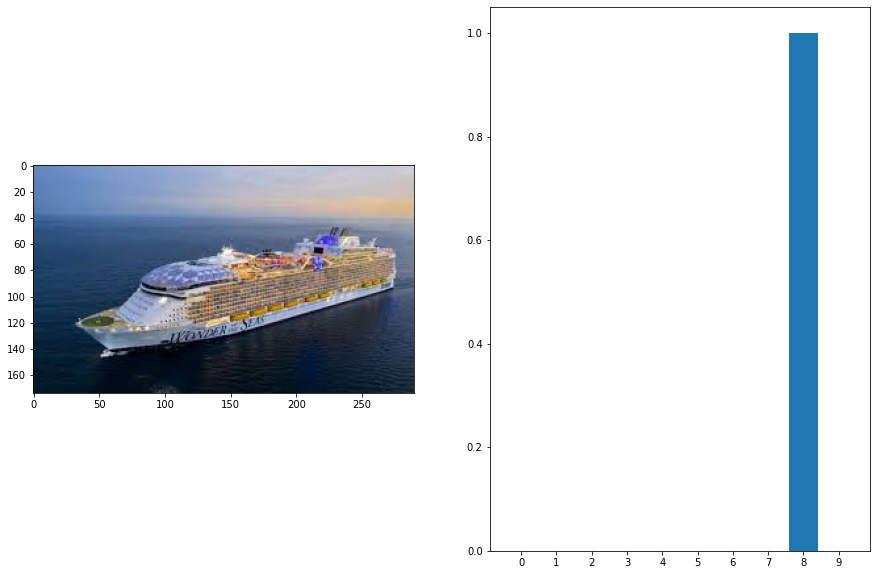

In [ ]:
find_img_prediction(next(images))

'airplane'

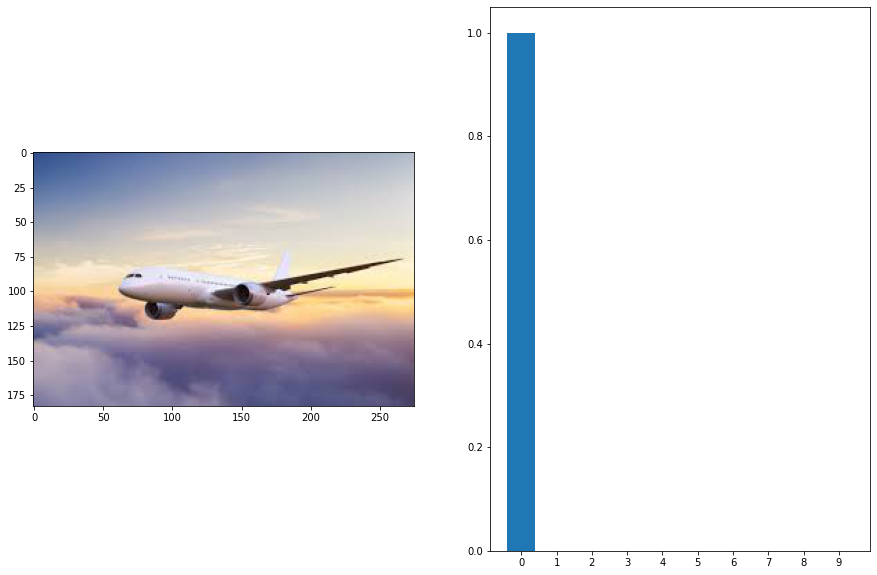

In [ ]:
find_img_prediction(next(images))

'airplane'

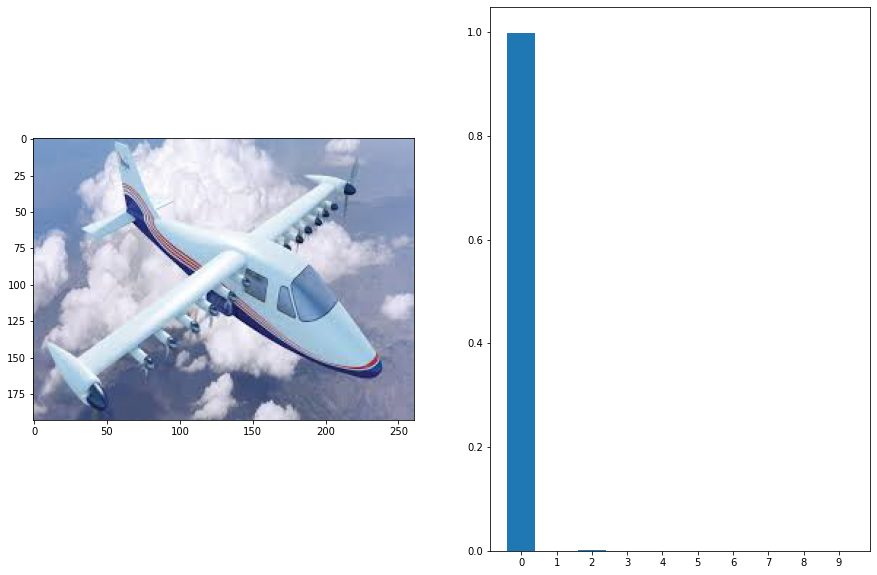

In [ ]:
find_img_prediction(next(images))

'dog'

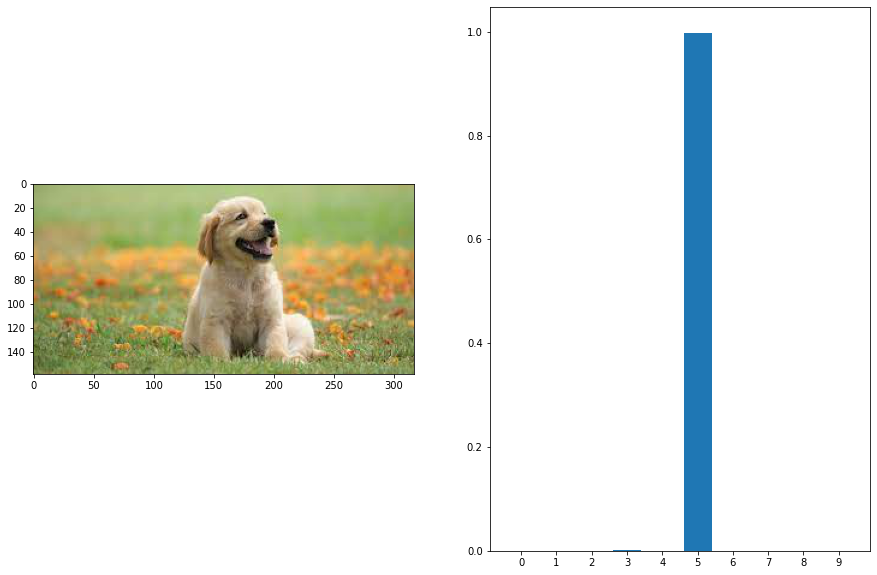

In [ ]:
find_img_prediction(next(images))

'truck'

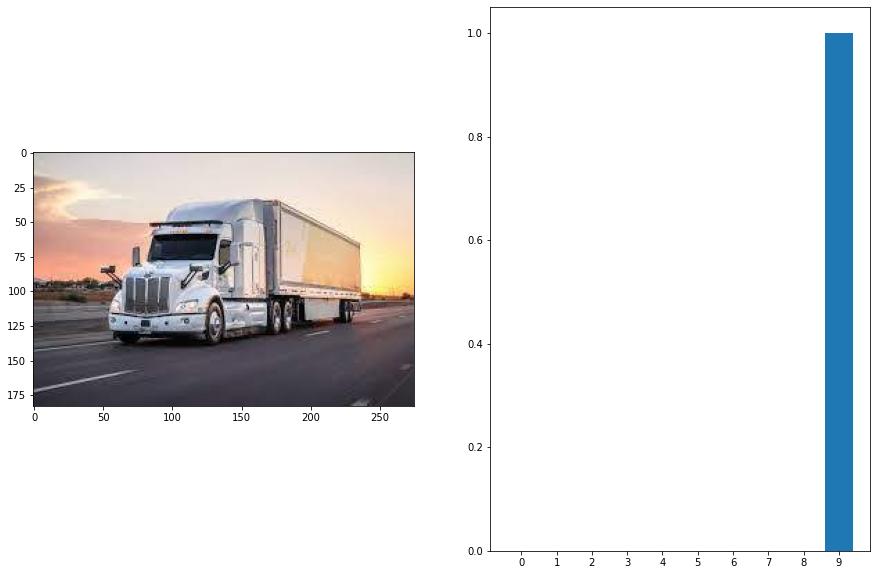

In [ ]:
find_img_prediction(next(images))

'airplane'

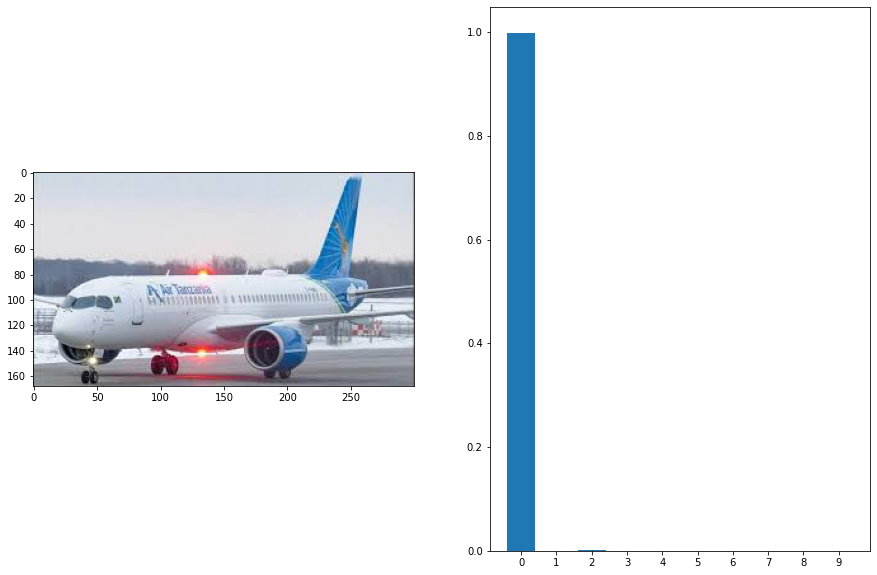

In [ ]:
find_img_prediction(next(images))

'airplane'

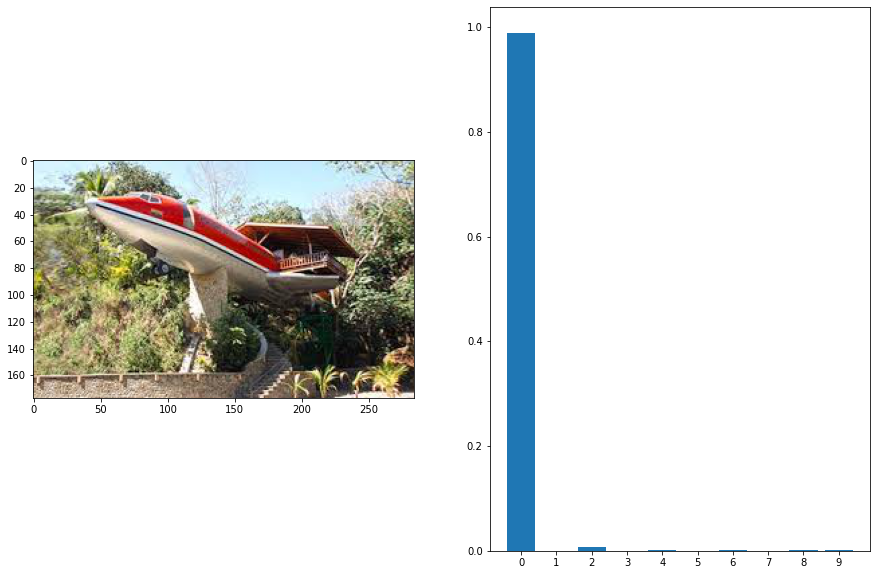

In [ ]:
find_img_prediction(next(images))

'airplane'

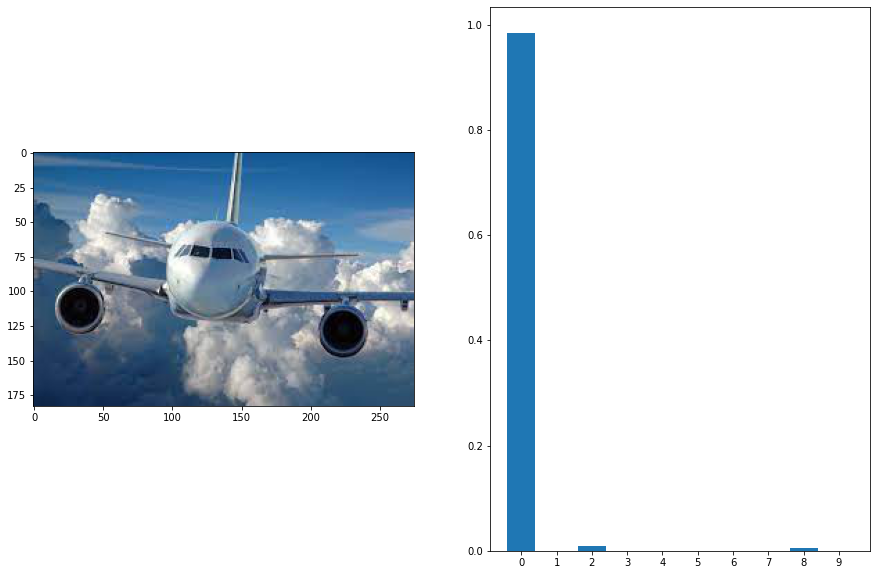

In [ ]:
find_img_prediction(next(images))

'dog'

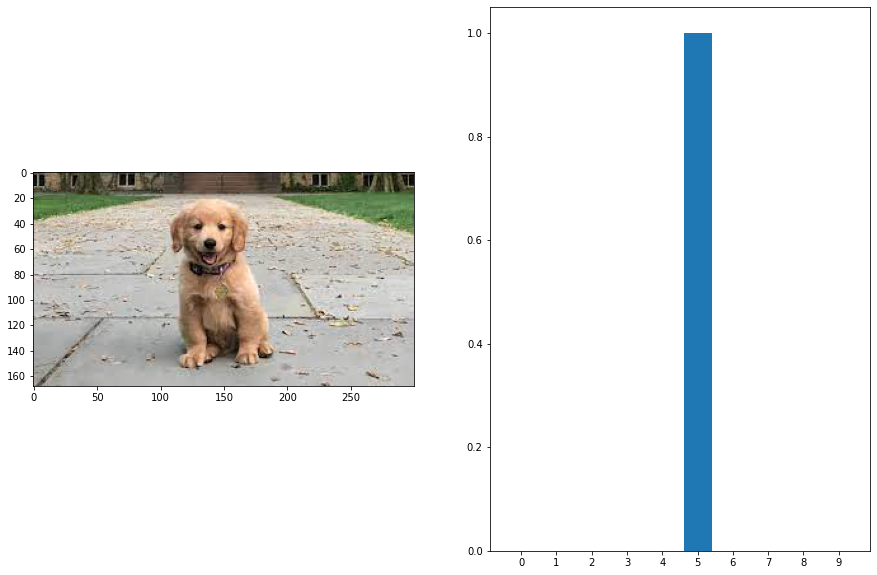

In [ ]:
find_img_prediction(next(images))

'cat'

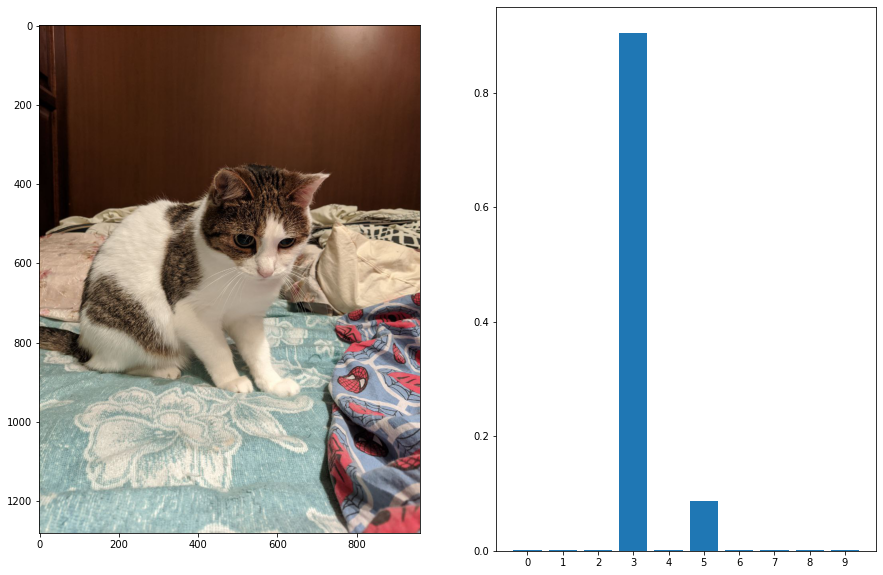

In [ ]:
find_img_prediction('/content/photo_2022-07-07_04-09-06.jpg')

'cat'

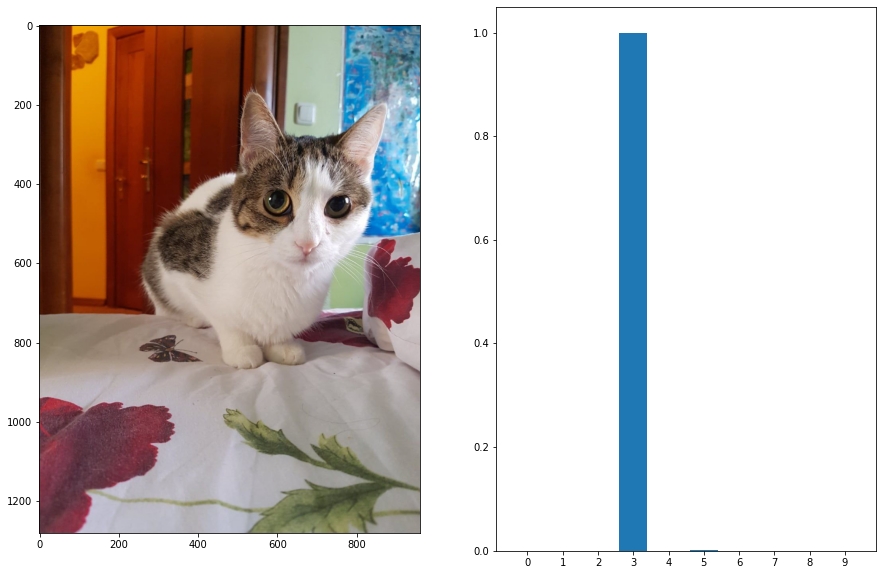

In [ ]:
find_img_prediction('/content/photo_2022-07-07_04-11-56.jpg')

'cat'

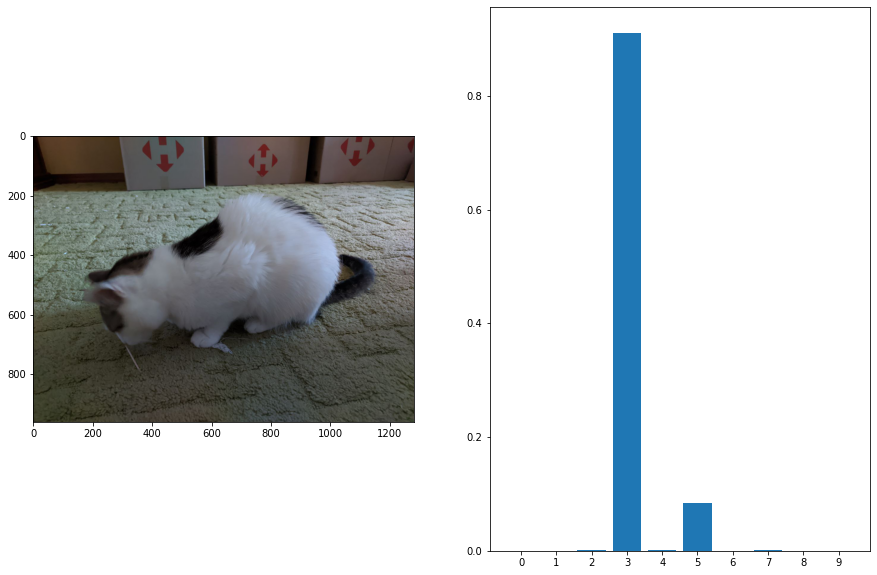

In [ ]:
find_img_prediction('/content/photo_2022-07-07_06-47-20.jpg')